In [ ]:
import torch
print(f'PyTorch : {torch.__version__}')
print(f'CUDA    : {torch.version.cuda}')
print(f'GPU     : {torch.cuda.get_device_name(0) if torch.cuda.is_available() else "NOT FOUND"}')
assert torch.cuda.is_available(), '❌  No GPU — Runtime → Change runtime type → T4 GPU'

PyTorch : 2.10.0+cu128
CUDA    : 12.8
GPU     : Tesla T4


In [ ]:
!pip install -q kagglehub timm scikit-learn tqdm matplotlib opencv-python-headless

In [ ]:
import os, sys
from google.colab import files

PROJECT_DIR = '/content/skin_lesion'
os.makedirs(PROJECT_DIR, exist_ok=True)
os.chdir(PROJECT_DIR)

uploaded = files.upload()
print('\n✅  Uploaded:')
for name in uploaded:
    print(f'    {name}')

if PROJECT_DIR not in sys.path:
    sys.path.insert(0, PROJECT_DIR)

Saving attention_gate.py to attention_gate.py
Saving cnn_encoder.py to cnn_encoder.py
Saving configs.py to configs.py
Saving dataset.py to dataset.py
Saving decoder.py to decoder.py
Saving dino_prior.py to dino_prior.py
Saving model.py to model.py
Saving testing.py to testing.py
Saving train.py to train.py
Saving train_utils.py to train_utils.py
Saving trainer.py to trainer.py

✅  Uploaded:
    attention_gate.py
    cnn_encoder.py
    configs.py
    dataset.py
    decoder.py
    dino_prior.py
    model.py
    testing.py
    train.py
    train_utils.py
    trainer.py


In [ ]:
import importlib, configs
importlib.reload(configs)
from configs import CONFIG
print('✅  configs.py loaded')
print(f'    image_size : {CONFIG["data"]["image_size"]}')
print(f'    batch_size : {CONFIG["data"]["batch_size"]}')
print(f'    epochs     : {CONFIG["train"]["epochs"]}')

✅  configs.py loaded
    image_size : (448, 448)
    batch_size : 16
    epochs     : 20


In [ ]:
import kagglehub
path = kagglehub.dataset_download('nightfury007/ham10000-isic2018-raw')
print(f'✅  Dataset root: {path}')
for entry in sorted(os.listdir(path)):
    print(f'    {entry}')

Using Colab cache for faster access to the 'ham10000-isic2018-raw' dataset.
✅  Dataset root: /kaggle/input/ham10000-isic2018-raw
    dataverse_files


In [ ]:
import glob
from pathlib import Path

def _find(root, pattern):
    hits = glob.glob(os.path.join(root, '**', pattern), recursive=True)
    return hits[0] if hits else None

IMG_DIR  = _find(path, 'HAM10000_images_combined_600x450')
MASK_DIR = _find(path, 'HAM10000_segmentations_lesion_tschandl')
META_CSV = _find(path, 'HAM10000_metadata')

if META_CSV and os.path.isdir(META_CSV):
    csvs = glob.glob(os.path.join(META_CSV, '*.csv'))
    META_CSV = csvs[0] if csvs else None

print(f'IMG_DIR  : {IMG_DIR}')
print(f'MASK_DIR : {MASK_DIR}')
print(f'META_CSV : {META_CSV}')
assert all([IMG_DIR, MASK_DIR, META_CSV]), '❌  Could not locate all dataset paths.'

IMG_DIR  : /kaggle/input/ham10000-isic2018-raw/dataverse_files/HAM10000_images_combined_600x450
MASK_DIR : /kaggle/input/ham10000-isic2018-raw/dataverse_files/HAM10000_segmentations_lesion_tschandl
META_CSV : /kaggle/input/ham10000-isic2018-raw/dataverse_files/HAM10000_metadata


In [ ]:
from configs import CONFIG

CONFIG['paths']['img_dir']   = IMG_DIR
CONFIG['paths']['mask_dir']  = MASK_DIR
CONFIG['paths']['metadata']  = META_CSV
CONFIG['paths']['save_dir']  = '/content/skin_lesion/outputs'
CONFIG['paths']['cache_dir'] = '/content/skin_lesion/dino_cache'
CONFIG['data'].setdefault('test_split', 0.15)

os.makedirs(CONFIG['paths']['save_dir'],  exist_ok=True)
os.makedirs(CONFIG['paths']['cache_dir'], exist_ok=True)

print('✅  CONFIG paths updated')
for key in ['img_dir', 'mask_dir', 'metadata']:
    p      = Path(CONFIG['paths'][key])
    status = '✅' if p.exists() else '❌  MISSING'
    print(f'  {status}  {key}: {p}')

✅  CONFIG paths updated
  ✅  img_dir: /kaggle/input/ham10000-isic2018-raw/dataverse_files/HAM10000_images_combined_600x450
  ✅  mask_dir: /kaggle/input/ham10000-isic2018-raw/dataverse_files/HAM10000_segmentations_lesion_tschandl
  ✅  metadata: /kaggle/input/ham10000-isic2018-raw/dataverse_files/HAM10000_metadata


In [ ]:
# ── 6a: Split ────────────────────────────────────────────────────
from dataset import get_splits

train_df, val_df, test_df = get_splits(
    metadata_csv = CONFIG['paths']['metadata'],
    mask_dir     = CONFIG['paths']['mask_dir'],
    val_split    = CONFIG['data']['val_split'],
    test_split   = CONFIG['data']['test_split'],
    seed         = CONFIG['data']['seed'],
)

total = len(train_df) + len(val_df) + len(test_df)
print(f'Split summary:')
print(f'  Train : {len(train_df):>5,}  ({100*len(train_df)/total:.1f}%)')
print(f'  Val   : {len(val_df):>5,}  ({100*len(val_df)/total:.1f}%)')
print(f'  Test  : {len(test_df):>5,}  ({100*len(test_df)/total:.1f}%)')
print(f'  Total : {total:>5,}')

# Zero-leakage assertion
train_ids = set(train_df['lesion_id'])
val_ids   = set(val_df['lesion_id'])
test_ids  = set(test_df['lesion_id'])
assert len(train_ids & test_ids) == 0, 'train/test lesion_id overlap!'
assert len(val_ids   & test_ids) == 0, 'val/test lesion_id overlap!'
assert len(train_ids & val_ids)  == 0, 'train/val lesion_id overlap!'
print('\n✅  Zero lesion_id overlap across all three splits.')

Split summary:
  Train : 6,412  (64.0%)
  Val   : 1,579  (15.8%)
  Test  : 2,024  (20.2%)
  Total : 10,015

✅  Zero lesion_id overlap across all three splits.


In [ ]:
# ── 6b: Build cache from TRAIN split only ─────────────────────────
import torch
from dino_prior import DinoPrior
from dataset    import build_dino_cache

cache_dir  = Path(CONFIG['paths']['cache_dir'])
device     = CONFIG['device']
cache_hits = len(list(cache_dir.glob('*.pt'))) if cache_dir.exists() else 0
REBUILD    = cache_hits < len(train_df)

print(f'Train images    : {len(train_df):,}')
print(f'Cached files    : {cache_hits:,}')
print(f'Rebuild needed  : {REBUILD}')

if REBUILD:
    print('\n⚙️   Building cache (~5-10 min on T4) ...')
    dino = DinoPrior(
        model_name = CONFIG['dino']['model_name'],
        patch_size = CONFIG['dino']['patch_size'],
        device     = device,
    ).to(device)

    build_dino_cache(
        img_dir      = CONFIG['paths']['img_dir'],
        mask_dir     = CONFIG['paths']['mask_dir'],
        metadata_csv = CONFIG['paths']['metadata'],
        cache_dir    = CONFIG['paths']['cache_dir'],
        dino_model   = dino,
        device       = device,
        batch_size   = 32,
        train_df     = train_df,    # ← train images ONLY
    )
    del dino
    torch.cuda.empty_cache()
else:
    print('\n⏭️   Cache already complete — skipping.')

# Leak check — test image IDs must not appear in cache
cached_ids     = {f.stem for f in cache_dir.glob('*.pt')}
test_image_ids = set(test_df['image_id'])
leaked         = cached_ids & test_image_ids
if leaked:
    raise RuntimeError(
        f'❌  DATA LEAKAGE: {len(leaked)} test images are in the DINO cache!\n'
        f'    Delete {cache_dir} and re-run this cell to rebuild cleanly.'
    )
print(f'\n✅  Leak check passed — 0 test images in DINO cache.')
print(f'    Cached {len(cached_ids):,} train maps in {cache_dir}')

Train images    : 6,412
Cached files    : 0
Rebuild needed  : True

⚙️   Building cache (~5-10 min on T4) ...
Downloading: "https://github.com/facebookresearch/dinov2/zipball/main" to /root/.cache/torch/hub/main.zip


/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")
/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/attention.py:33: UserWarning: xFormers is not available (Attention)
  warnings.warn("xFormers is not available (Attention)")
/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/block.py:40: UserWarning: xFormers is not available (Block)
  warnings.warn("xFormers is not available (Block)")


Downloading: "https://dl.fbaipublicfiles.com/dinov2/dinov2_vits14/dinov2_vits14_reg4_pretrain.pth" to /root/.cache/torch/hub/checkpoints/dinov2_vits14_reg4_pretrain.pth


100%|██████████| 84.2M/84.2M [00:00<00:00, 303MB/s]
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:424: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()


🔒  Cache restricted to 6,412 TRAIN images only (test set is leak-free).


Building DINO cache:   0%|          | 0/201 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:432: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()
Building DINO cache: 100%|██████████| 201/201 [02:43<00:00,  1.23it/s]

✅  Cached 6412 DINO maps → /content/skin_lesion/dino_cache

✅  Leak check passed — 0 test images in DINO cache.
    Cached 6,412 train maps in /content/skin_lesion/dino_cache


In [ ]:
from torch.utils.data import DataLoader
from dataset import HAMDataset

cache_dir  = CONFIG['paths']['cache_dir']
batch_size = CONFIG['data']['batch_size']
do_augment = CONFIG['data'].get('augment', False)

# train — cache ON, augment ON
train_ds = HAMDataset(train_df,
                      CONFIG['paths']['img_dir'], CONFIG['paths']['mask_dir'],
                      cache_dir=cache_dir, augment=do_augment)

# val   — cache ON, augment OFF
val_ds   = HAMDataset(val_df,
                      CONFIG['paths']['img_dir'], CONFIG['paths']['mask_dir'],
                      cache_dir=cache_dir, augment=False)

# test  — cache OFF (live DINO), augment OFF
test_ds  = HAMDataset(test_df,
                      CONFIG['paths']['img_dir'], CONFIG['paths']['mask_dir'],
                      cache_dir=None, augment=False)   # cache_dir=None is intentional

common_kw = dict(
    num_workers        = CONFIG['data']['num_workers'],
    pin_memory         = CONFIG['data']['pin_memory'],
    persistent_workers = CONFIG['data']['num_workers'] > 0,
)
train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True,  **common_kw)
val_loader   = DataLoader(val_ds,   batch_size=batch_size, shuffle=False, **common_kw)
test_loader  = DataLoader(test_ds,  batch_size=batch_size, shuffle=False, **common_kw)

print('Loaders ready:')
print(f'  Train : {len(train_ds):,}  cache=ON   augment={do_augment}')
print(f'  Val   : {len(val_ds):,}  cache=ON   augment=False')
print(f'  Test  : {len(test_ds):,}  cache=OFF  augment=False  (live DINO inference)')

Loaders ready:
  Train : 6,412  cache=ON   augment=True
  Val   : 1,579  cache=ON   augment=False
  Test  : 2,024  cache=OFF  augment=False  (live DINO inference)


img: (16, 3, 448, 448)  mask: (16, 1, 448, 448)  attn: (16, 1, 448, 448)
attn ndim=4  (4=cached ✅, 1=cache miss ⚠️)


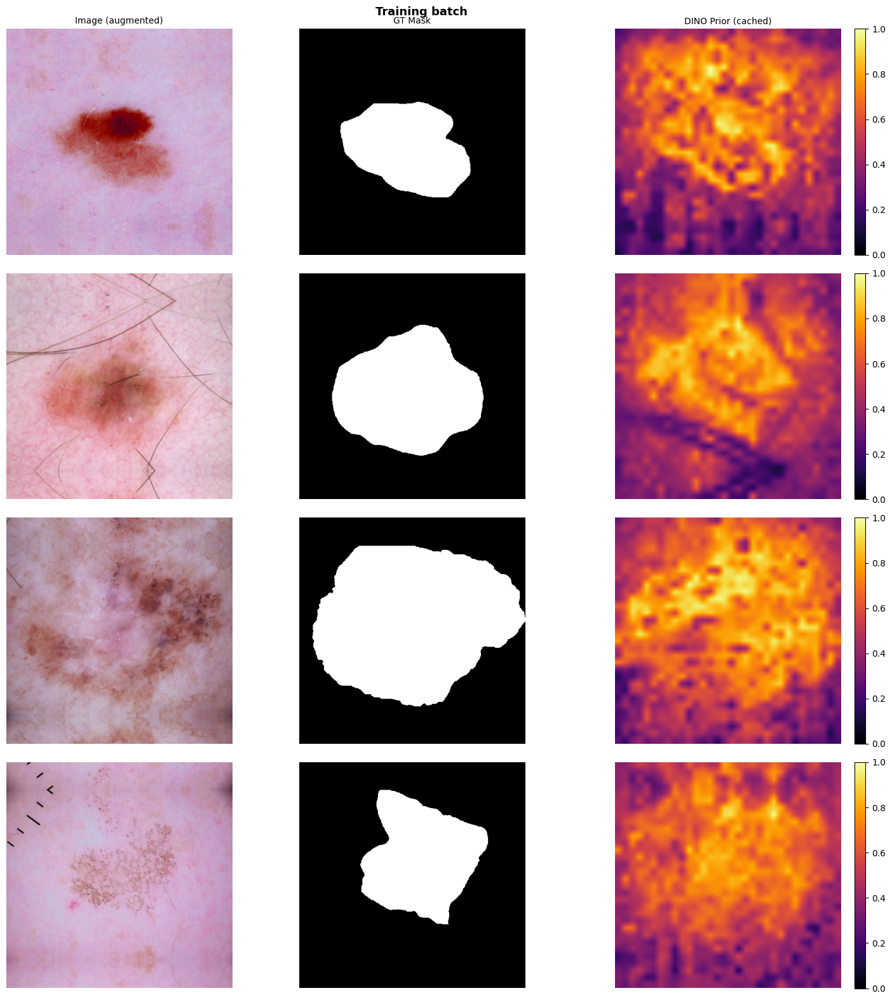

In [ ]:
# Visualise a train batch
import numpy as np, matplotlib.pyplot as plt

imgs, masks, attns = next(iter(train_loader))
print(f'img: {tuple(imgs.shape)}  mask: {tuple(masks.shape)}  attn: {tuple(attns.shape)}')
print(f'attn ndim={attns.ndim}  (4=cached ✅, 1=cache miss ⚠️)')

n = min(4, imgs.shape[0])
has_attn = attns.ndim == 4
cols = 3 if has_attn else 2
fig, axes = plt.subplots(n, cols, figsize=(5*cols, 4*n))
if n == 1: axes = axes[np.newaxis, :]
titles = ['Image (augmented)', 'GT Mask'] + (['DINO Prior (cached)'] if has_attn else [])
for c, t in enumerate(titles): axes[0, c].set_title(t, fontsize=10)
for i in range(n):
    axes[i, 0].imshow(np.clip(imgs[i].permute(1,2,0).numpy(), 0, 1))
    axes[i, 0].axis('off')
    axes[i, 1].imshow(masks[i].squeeze().numpy(), cmap='gray')
    axes[i, 1].axis('off')
    if has_attn:
        im = axes[i, 2].imshow(attns[i].squeeze().numpy(), cmap='inferno', vmin=0, vmax=1)
        axes[i, 2].axis('off')
        plt.colorbar(im, ax=axes[i, 2], fraction=0.046, pad=0.04)
fig.suptitle('Training batch', fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()

In [ ]:
import torch
from model   import SegmentationModel
from configs import CONFIG

device = CONFIG['device']
model  = SegmentationModel(config=CONFIG, device=device)

total_p     = sum(p.numel() for p in model.parameters())
trainable_p = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f'Total params     : {total_p:,}')
print(f'Trainable params : {trainable_p:,}')

with torch.no_grad():
    dummy    = torch.randn(2, 3, 448, 448).to(device)
    out, att = model(dummy)
    print(f'Forward check — output: {tuple(out.shape)}  attn: {tuple(att.shape)}')
del dummy, out, att
torch.cuda.empty_cache()

Downloading: "https://download.pytorch.org/models/convnext_tiny-983f1562.pth" to /root/.cache/torch/hub/checkpoints/convnext_tiny-983f1562.pth


100%|██████████| 109M/109M [00:00<00:00, 173MB/s] 
Using cache found in /root/.cache/torch/hub/facebookresearch_dinov2_main


Total params     : 51,827,617
Trainable params : 29,769,505
Forward check — output: (2, 1, 448, 448)  attn: (2, 1, 448, 448)


In [ ]:
import os, json, torch
from torch.optim import AdamW
from torch.optim.lr_scheduler import CosineAnnealingLR, LinearLR, SequentialLR
from trainer import train_one_epoch, validate
from configs import CONFIG

cfg_t    = CONFIG['train']
epochs   = cfg_t['epochs']
save_dir = CONFIG['paths']['save_dir']

# Per-component learning rates; DINO excluded when frozen
param_groups = [
    {'params': model.encoder.parameters(), 'lr': cfg_t['encoder_lr']},
    {'params': model.gate.parameters(),    'lr': cfg_t['lr']},
    {'params': model.decoder.parameters(), 'lr': cfg_t['lr']},
]
if not CONFIG['dino']['freeze']:
    td = [p for p in model.dino.parameters() if p.requires_grad]
    if td:
        param_groups.insert(0, {'params': td, 'lr': cfg_t['dino_lr']})
        print(f'🔓  DINO unfrozen — {len(td)} tensors in optimizer')
else:
    print('🔒  DINO frozen — excluded from optimizer')

optimizer = AdamW(param_groups, weight_decay=cfg_t['weight_decay'])
scheduler = SequentialLR(
    optimizer,
    schedulers=[
        LinearLR(optimizer, start_factor=1e-3, end_factor=1.0,
                 total_iters=cfg_t['warmup_epochs']),
        CosineAnnealingLR(optimizer, T_max=epochs - cfg_t['warmup_epochs'], eta_min=1e-7),
    ],
    milestones=[cfg_t['warmup_epochs']],
)
scaler        = torch.cuda.amp.GradScaler(enabled=CONFIG['use_amp'])
history       = {'train_loss':[], 'train_acc':[], 'val_loss':[], 'val_acc':[]}
best_val_dice = 0.0
best_ckpt     = os.path.join(save_dir, 'best_model.pth')

print(f"\n{'='*65}")
print(f"  Training  |  {epochs} epochs  |  {device.upper()}")
print(f"{'='*65}\n")

for epoch in range(1, epochs + 1):
    train_m = train_one_epoch(model, train_loader, optimizer, device,
                              scaler, grad_clip=cfg_t['grad_clip'])
    val_m   = validate(model, val_loader, device)
    scheduler.step()
    lr = optimizer.param_groups[-1]['lr']

    print(
        f"Epoch [{epoch:>3}/{epochs}]  "
        f"Train loss={train_m['loss']:.4f}  dice={train_m['dice']:.4f}  acc={train_m['acc']:.4f}  "
        f"| Val loss={val_m['loss']:.4f}  dice={val_m['dice']:.4f}  acc={val_m['acc']:.4f}  "
        f"| LR={lr:.2e}"
    )
    history['train_loss'].append(train_m['loss'])
    history['train_acc'].append(train_m['acc'])
    history['val_loss'].append(val_m['loss'])
    history['val_acc'].append(val_m['acc'])

    if val_m['dice'] > best_val_dice:
        best_val_dice = val_m['dice']
        torch.save({'epoch': epoch, 'state_dict': model.state_dict(),
                    'optimizer': optimizer.state_dict(), 'val_dice': best_val_dice},
                   best_ckpt)
        print(f'  ✅  Best model saved  (val dice = {best_val_dice:.4f})')

with open(os.path.join(save_dir, 'history.json'), 'w') as f:
    json.dump(history, f, indent=2)
print(f'\n✅  Training complete. Best val dice: {best_val_dice:.4f}')

/tmp/ipykernel_4111/332019357.py:35: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler        = torch.cuda.amp.GradScaler(enabled=CONFIG['use_amp'])


🔒  DINO frozen — excluded from optimizer

  Training  |  20 epochs  |  CUDA



Train:   0%|          | 0/401 [00:00<?, ?it/s]/content/skin_lesion/trainer.py:57: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Val:   0%|          | 0/99 [00:00<?, ?it/s]/content/skin_lesion/trainer.py:109: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch [  1/20]  Train loss=1.6112  dice=0.3011  acc=0.3367  | Val loss=1.5845  dice=0.2989  acc=0.3549  | LR=2.01e-05
  ✅  Best model saved  (val dice = 0.2989)


Epoch [  2/20]  Train loss=0.3664  dice=0.8538  acc=0.9396  | Val loss=0.1827  dice=0.9259  acc=0.9716  | LR=4.01e-05
  ✅  Best model saved  (val dice = 0.9259)


Epoch [  3/20]  Train loss=0.1966  dice=0.9198  acc=0.9685  | Val loss=0.1664  dice=0.9327  acc=0.9738  | LR=6.00e-05
  ✅  Best model saved  (val dice = 0.9327)


Epoch [  4/20]  Train loss=0.1668  dice=0.9319  acc=0.9728  | Val loss=0.1621  dice=0.9363  acc=0.9751  | LR=8.00e-05
  ✅  Best model saved  (val dice = 0.9363)


Epoch [  5/20]  Train loss=0.1511  dice=0.9379  acc=0.9753  | Val loss=0.1456  dice=0.9416  acc=0.9778  | LR=1.00e-04
  ✅  Best model saved  (val dice = 0.9416)


Epoch [  6/20]  Train loss=0.1431  dice=0.9403  acc=0.9763  | Val loss=0.1377  dice=0.9432  acc=0.9780  | LR=9.89e-05
  ✅  Best model saved  (val dice = 0.9432)


Epoch [  7/20]  Train loss=0.1333  dice=0.9450  acc=0.9779  | Val loss=0.1405  dice=0.9442  acc=0.9776  | LR=9.57e-05
  ✅  Best model saved  (val dice = 0.9442)


Epoch [  8/20]  Train loss=0.1225  dice=0.9485  acc=0.9797  | Val loss=0.1382  dice=0.9445  acc=0.9783  | LR=9.05e-05
  ✅  Best model saved  (val dice = 0.9445)


Epoch [  9/20]  Train loss=0.1154  dice=0.9518  acc=0.9807  | Val loss=0.1365  dice=0.9432  acc=0.9791  | LR=8.35e-05


Epoch [ 10/20]  Train loss=0.1099  dice=0.9537  acc=0.9817  | Val loss=0.1347  dice=0.9475  acc=0.9797  | LR=7.50e-05
  ✅  Best model saved  (val dice = 0.9475)


Epoch [ 11/20]  Train loss=0.1032  dice=0.9562  acc=0.9827  | Val loss=0.1292  dice=0.9478  acc=0.9795  | LR=6.55e-05
  ✅  Best model saved  (val dice = 0.9478)


Epoch [ 12/20]  Train loss=0.0974  dice=0.9585  acc=0.9837  | Val loss=0.1333  dice=0.9479  acc=0.9796  | LR=5.53e-05
  ✅  Best model saved  (val dice = 0.9479)


Epoch [ 13/20]  Train loss=0.0916  dice=0.9609  acc=0.9845  | Val loss=0.1289  dice=0.9496  acc=0.9801  | LR=4.48e-05
  ✅  Best model saved  (val dice = 0.9496)


Epoch [ 14/20]  Train loss=0.0878  dice=0.9625  acc=0.9852  | Val loss=0.1331  dice=0.9486  acc=0.9795  | LR=3.46e-05


Epoch [ 15/20]  Train loss=0.0849  dice=0.9636  acc=0.9857  | Val loss=0.1320  dice=0.9495  acc=0.9801  | LR=2.51e-05


Epoch [ 16/20]  Train loss=0.0815  dice=0.9652  acc=0.9862  | Val loss=0.1334  dice=0.9493  acc=0.9798  | LR=1.66e-05


Epoch [ 17/20]  Train loss=0.0788  dice=0.9661  acc=0.9867  | Val loss=0.1356  dice=0.9498  acc=0.9802  | LR=9.64e-06
  ✅  Best model saved  (val dice = 0.9498)


Epoch [ 18/20]  Train loss=0.0758  dice=0.9673  acc=0.9871  | Val loss=0.1379  dice=0.9490  acc=0.9799  | LR=4.42e-06


Epoch [ 19/20]  Train loss=0.0748  dice=0.9676  acc=0.9873  | Val loss=0.1373  dice=0.9499  acc=0.9802  | LR=1.19e-06
  ✅  Best model saved  (val dice = 0.9499)


Epoch [ 20/20]  Train loss=0.0739  dice=0.9680  acc=0.9875  | Val loss=0.1385  dice=0.9497  acc=0.9801  | LR=1.00e-07

✅  Training complete. Best val dice: 0.9499


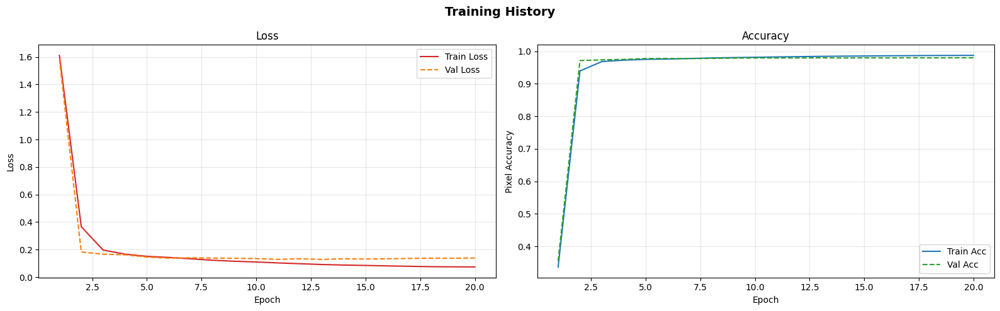

📈  Saved → /content/skin_lesion/outputs/training_curves.png


In [ ]:
import matplotlib.pyplot as plt

ep = range(1, len(history['train_loss']) + 1)
fig, axes = plt.subplots(1, 2, figsize=(16, 5))
fig.suptitle('Training History', fontsize=14, fontweight='bold')

axes[0].plot(ep, history['train_loss'], color='tab:red',    label='Train Loss')
axes[0].plot(ep, history['val_loss'],   color='tab:orange', label='Val Loss',  linestyle='--')
axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Loss')
axes[0].set_title('Loss'); axes[0].legend(); axes[0].grid(alpha=0.3)

axes[1].plot(ep, history['train_acc'], color='tab:blue',  label='Train Acc')
axes[1].plot(ep, history['val_acc'],   color='tab:green', label='Val Acc',  linestyle='--')
axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Pixel Accuracy')
axes[1].set_title('Accuracy'); axes[1].legend(); axes[1].grid(alpha=0.3)

plt.tight_layout()
curve_path = os.path.join(CONFIG['paths']['save_dir'], 'training_curves.png')
plt.savefig(curve_path, dpi=150, bbox_inches='tight')
plt.show()
print(f'📈  Saved → {curve_path}')

In [ ]:
import torch, json, os
from tqdm    import tqdm
from testing import compute_metrics, save_research_viz
from model   import SegmentationModel
from configs import CONFIG

device   = CONFIG['device']
save_dir = CONFIG['paths']['save_dir']
viz_dir  = os.path.join(save_dir, 'test_viz')
os.makedirs(viz_dir, exist_ok=True)
THRESH  = 0.5
NUM_VIZ = 12

# Load best checkpoint
test_model = SegmentationModel(config=CONFIG, device=device)
ckpt       = torch.load(os.path.join(save_dir, 'best_model.pth'), map_location=device)
test_model.load_state_dict(ckpt['state_dict'])
test_model.eval()
print(f"✅  Checkpoint — epoch {ckpt.get('epoch','?')}  val_dice={ckpt.get('val_dice',0.):.4f}")
print(f'\n🔍  Test set: {len(test_ds):,} samples — cache=OFF, augment=OFF, unseen during training\n')

aggregated = {k: 0.0 for k in ['dice','iou','precision','recall','f1','accuracy']}
n_samples  = 0
viz_count  = 0

with torch.no_grad():
    for batch in tqdm(test_loader, desc='Testing'):
        imgs  = batch[0].to(device, non_blocking=True)
        masks = batch[1].to(device, non_blocking=True)
        # test_ds has cache_dir=None → batch[2] is always empty → live DINO runs
        with torch.cuda.amp.autocast():
            preds, _ = test_model(imgs, cached_attn=None)

        metrics = compute_metrics(preds, masks, thresh=THRESH)
        bs      = imgs.size(0)
        for k, v in metrics.items():
            aggregated[k] += v * bs
        n_samples += bs

        if viz_count < NUM_VIZ:
            for i in range(min(bs, NUM_VIZ - viz_count)):
                save_research_viz(
                    img        = imgs[i].cpu(),
                    gt_mask    = masks[i].cpu(),
                    pred_logit = preds[i].cpu(),
                    sample_id  = viz_count,
                    save_dir   = viz_dir,
                    thresh     = THRESH,
                )
                viz_count += 1

final = {k: v / n_samples for k, v in aggregated.items()}

print(f"\n{'='*50}")
print(f"  TEST RESULTS  ({n_samples:,} samples)")
print(f"{'='*50}")
for metric, value in final.items():
    print(f'  {metric.capitalize():<15} {value:.4f}')
print(f"{'='*50}")

with open(os.path.join(save_dir, 'metrics.json'), 'w') as f:
    json.dump(final, f, indent=2)
print(f'\n📄  metrics.json → {save_dir}')
print(f'🖼️   Research viz  → {viz_dir}/ ({viz_count} files)')

Using cache found in /root/.cache/torch/hub/facebookresearch_dinov2_main


✅  Checkpoint — epoch 19  val_dice=0.9499

🔍  Test set: 2,024 samples — cache=OFF, augment=OFF, unseen during training



Testing:   0%|          | 0/127 [00:00<?, ?it/s]/tmp/ipykernel_4111/1279089205.py:31: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Testing: 100%|██████████| 127/127 [00:59<00:00,  2.12it/s]


  TEST RESULTS  (2,024 samples)
  Dice            0.9503
  Iou             0.9112
  Precision       0.9549
  Recall          0.9535
  F1              0.9503
  Accuracy        0.9808

📄  metrics.json → /content/skin_lesion/outputs
🖼️   Research viz  → /content/skin_lesion/outputs/test_viz/ (12 files)


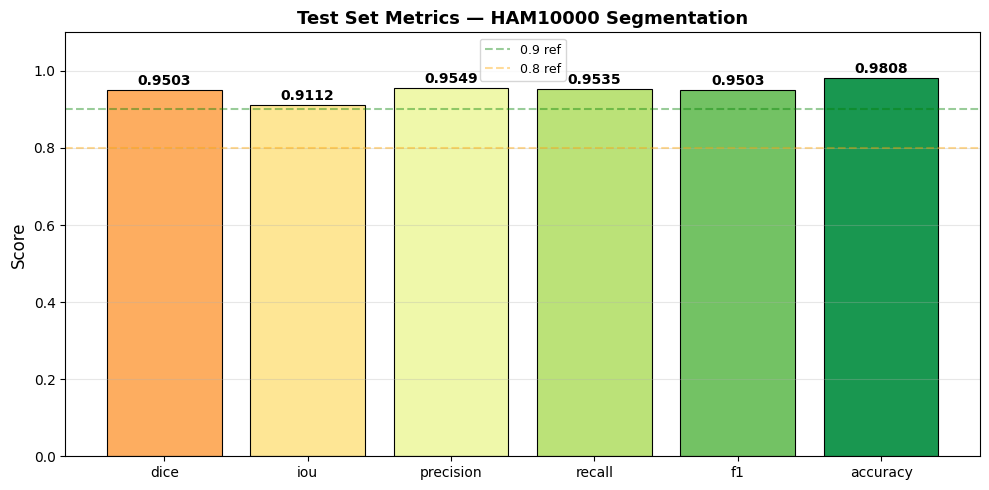

📊  Saved → /content/skin_lesion/outputs/metrics_bar.png


In [ ]:
import matplotlib.pyplot as plt, numpy as np

names  = list(final.keys())
values = list(final.values())
colors = plt.cm.RdYlGn(np.linspace(0.3, 0.9, len(names)))

fig, ax = plt.subplots(figsize=(10, 5))
bars = ax.bar(names, values, color=colors, edgecolor='black', linewidth=0.8)
for bar, val in zip(bars, values):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
            f'{val:.4f}', ha='center', va='bottom', fontsize=10, fontweight='bold')
ax.set_ylim(0, 1.1)
ax.set_ylabel('Score', fontsize=12)
ax.set_title('Test Set Metrics — HAM10000 Segmentation', fontsize=13, fontweight='bold')
ax.axhline(0.9, color='green',  linestyle='--', alpha=0.4, label='0.9 ref')
ax.axhline(0.8, color='orange', linestyle='--', alpha=0.4, label='0.8 ref')
ax.legend(fontsize=9); ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
bar_path = os.path.join(CONFIG['paths']['save_dir'], 'metrics_bar.png')
plt.savefig(bar_path, dpi=150, bbox_inches='tight')
plt.show()
print(f'📊  Saved → {bar_path}')

Displaying 12 figures


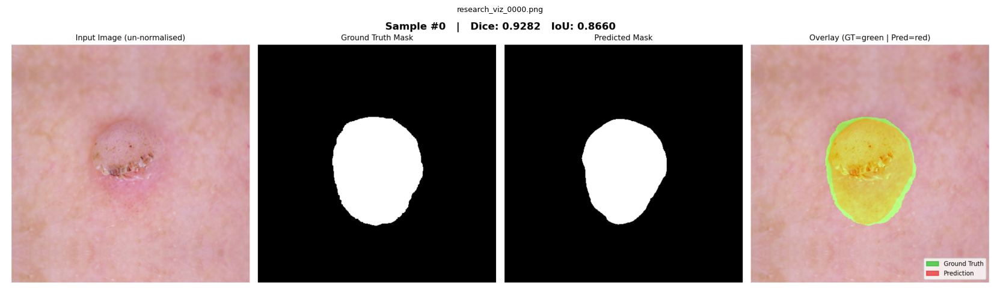

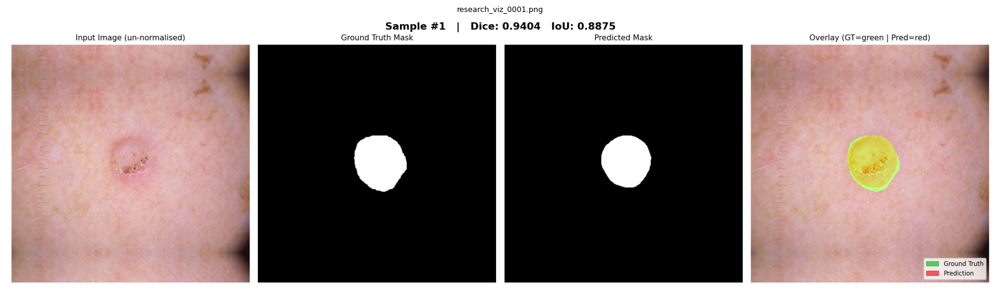

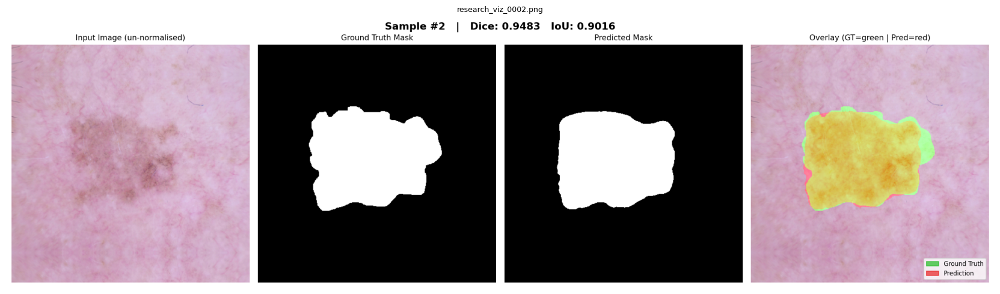

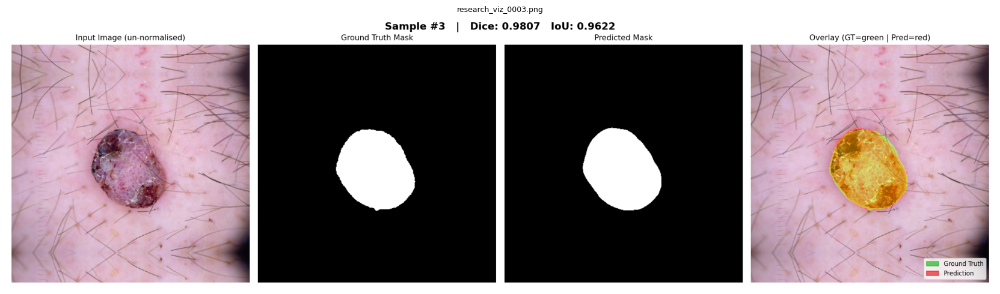

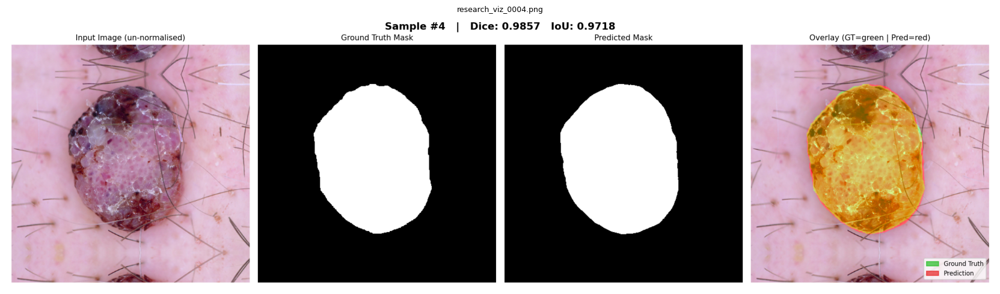

...

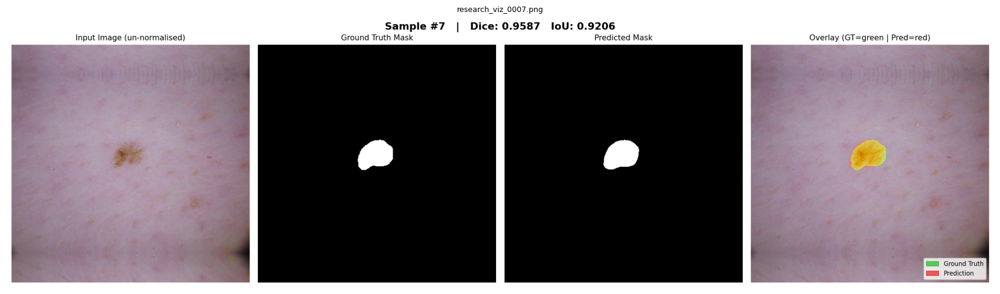

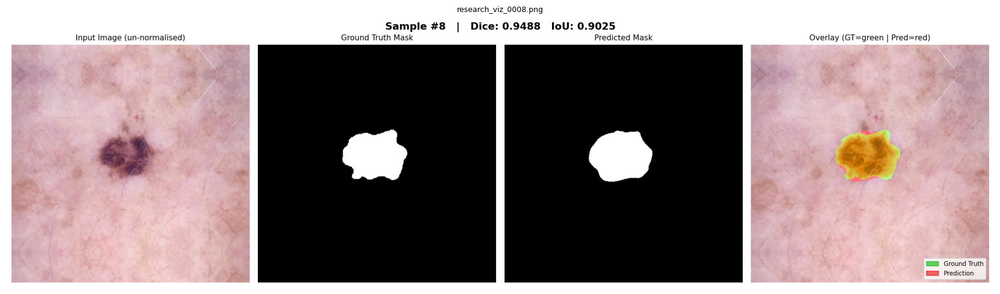

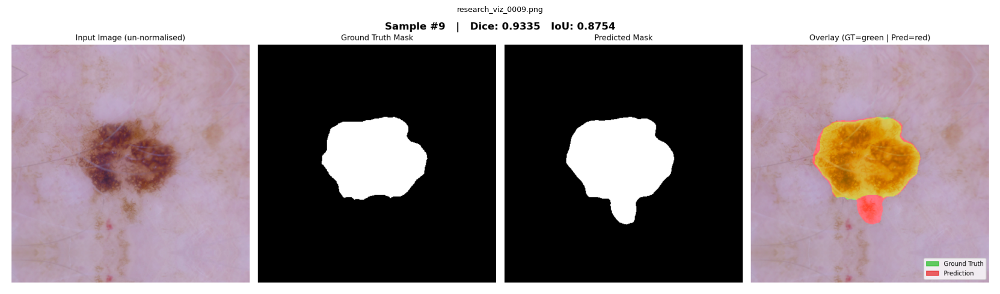

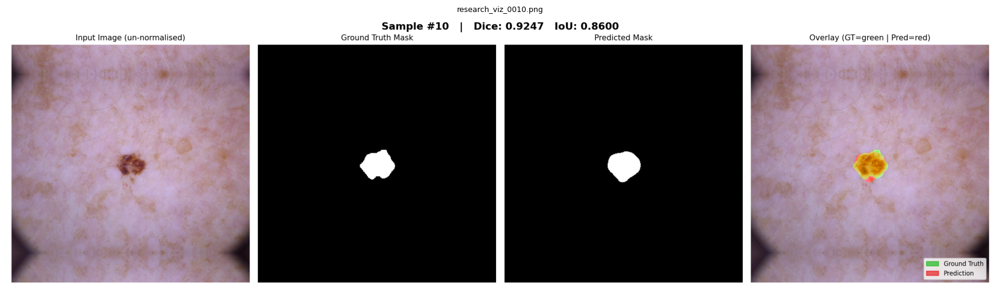

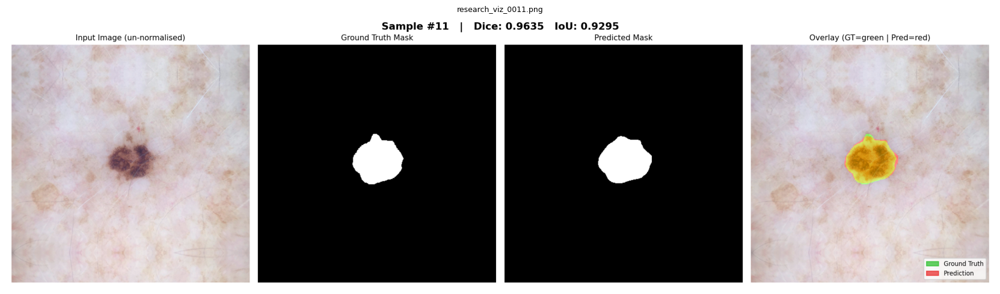

In [ ]:
import matplotlib.pyplot as plt, matplotlib.image as mpimg
from pathlib import Path

viz_files = sorted(Path(viz_dir).glob('research_viz_*.png'))
print(f'Displaying {len(viz_files)} figures')
for vf in viz_files:
    fig, ax = plt.subplots(figsize=(20, 5))
    ax.imshow(mpimg.imread(str(vf)))
    ax.axis('off')
    ax.set_title(vf.name, fontsize=9)
    plt.tight_layout(); plt.show()

In [ ]:
import shutil
from google.colab import files

save_dir = CONFIG['paths']['save_dir']
files.download(os.path.join(save_dir, 'best_model.pth'))
files.download(os.path.join(save_dir, 'metrics.json'))
files.download(os.path.join(save_dir, 'training_curves.png'))
files.download(os.path.join(save_dir, 'metrics_bar.png'))

zip_path = '/content/skin_lesion/research_viz'
shutil.make_archive(zip_path, 'zip', viz_dir)
files.download(zip_path + '.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>